Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

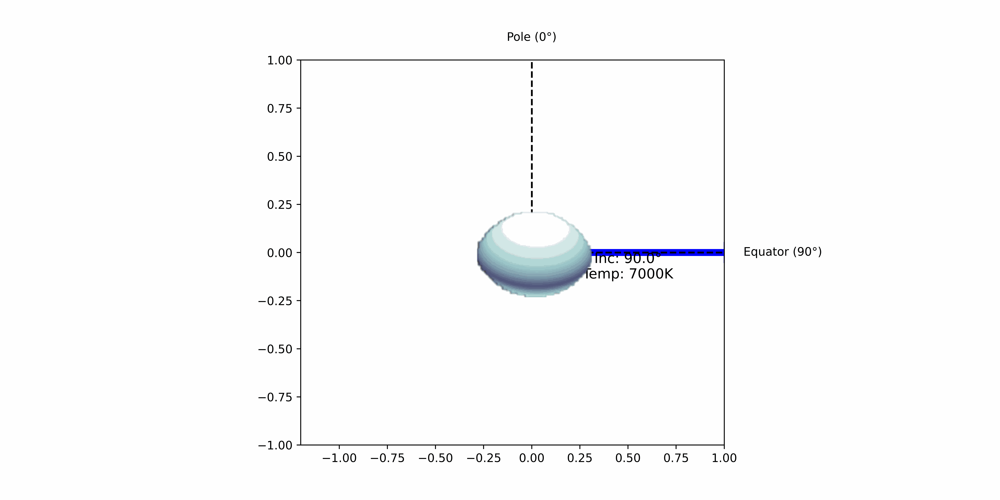

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


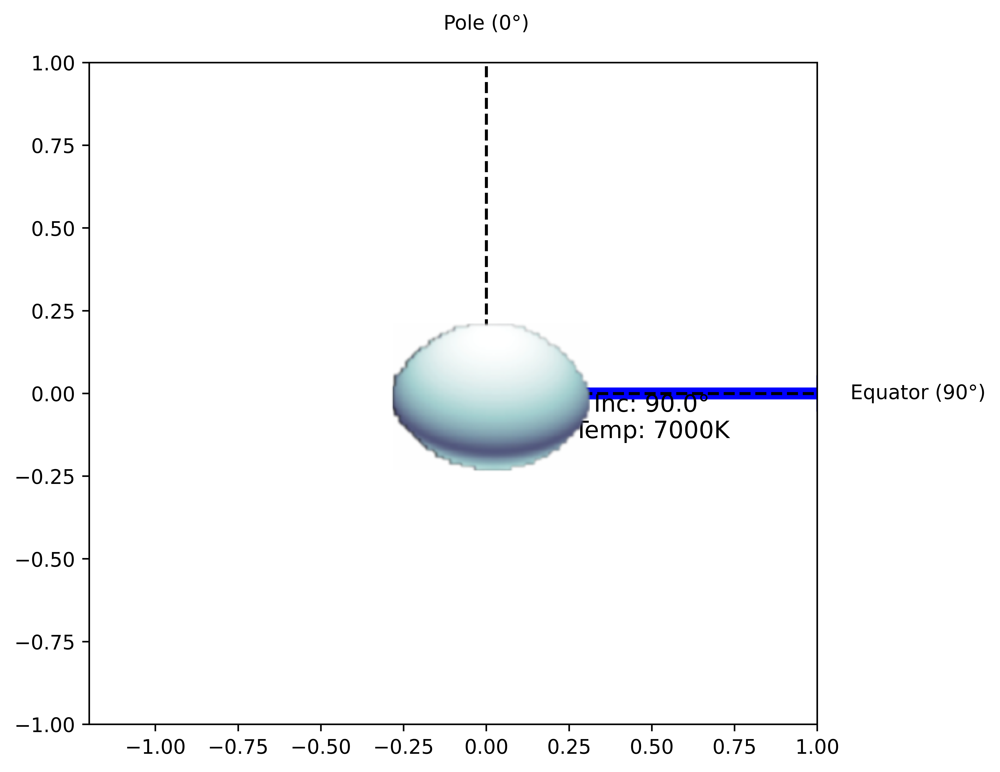

In [34]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.patches import FancyArrow
from IPython.display import display, Image
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from scipy.ndimage import rotate

# Read the img
oblate_img = plt.imread('/Users/john/Downloads/My project-1.png')  

# Rotate the oblate image by 90 degrees
oblate_img_rotated = rotate(oblate_img, -90)

# Function to calculate the temperature based on the frame number
def calculate_temperature(frame):
    # Linear interpolation to calculate temperature between 10250 and 11500
    start_temp = 11500
    stop_temp = 7000
    total_frames = 90
    return start_temp + (stop_temp - start_temp) * (frame / total_frames)

# Create a function to plot the background with the dashed lines representing north and east
def plot_background(ax, angle, temperature):
    ax.cla()  # Clear the current plot
    ax.set_xlim(-1.2, 1)
    ax.set_ylim(-1, 1)
    ax.set_aspect('equal', 'box')

    # Draw a dashed line representing the north direction
    ax.plot([0, 0], [0, 1], 'k--')

    # Draw a dashed line representing the east direction
    ax.plot([0, 1], [0, 0], 'k--')

    # Add text labels for the north and east directions
    ax.text(0, 1.1, "Pole (0°)", ha='center')
    ax.text(1.1, 0.0, "Equator (90°)", va='center')

    # Add title with counter underneath the arrow and temperature info
    ax.text(np.sin(np.deg2rad(angle))/2, np.cos(np.deg2rad(angle))/2,
            f"Inc: {angle:.1f}\u00b0\nTemp: {temperature:.0f}K", fontsize=12, ha='center', va='top')

    # Add the oblate image to the plot at the point (0, 0)
    oblate_center_x = 0  # x-coordinate of the image center (stationary at (0, 0))
    oblate_center_y = 0  # y-coordinate of the image center (stationary at (0, 0))
    imagebox = OffsetImage(oblate_img_rotated, zoom=0.6)  # Increase the 'zoom' value for a larger image
    ab = AnnotationBbox(imagebox, (oblate_center_x, oblate_center_y), frameon=False)
    ax.add_artist(ab)

# Function to update the plot with the current angle and temperature
def update(frame):
    # Update the angle animation
    angle = frame
    temperature = calculate_temperature(frame)
    plot_background(ax_combined, angle, temperature)

    # Draw an arrow representing the angle
    arrow = FancyArrow(0, 0, np.sin(np.deg2rad(angle)), np.cos(np.deg2rad(angle)),
                       width=0.03, head_width=0.1, head_length=0.1, fc='b', ec='b')
    ax_combined.add_patch(arrow)

    # Stop the angle animation when the angle reaches or exceeds 0 degrees
    if angle <= 0:
        animation_combined.event_source.stop()

# Create a figure and axis with higher resolution for the combined animation
fig_combined, ax_combined = plt.subplots(figsize=(12, 6), dpi=700)

# Create the combined animation, with 91 frames (90 to 0 degrees) for smoother motion
animation_combined = FuncAnimation(fig_combined, update, frames=range(90, -1, -1), interval=50)

# To save the combined animation to a file (optional)
animation_combined.save('combined_animation.gif', writer='pillow', fps=60)

# To display the animation in Jupyter Notebook or an interactive environment, use:
# plt.show()

# To display the animation as a GIF (if 'pillow' is installed), use:
with open('combined_animation.gif', 'rb') as f:
    display(Image(f.read()))
